In [1]:
import sys
import pandas as pd
import scipy.special as spsp
import scipy.stats as stats
import researchpy as rp
import statsmodels.api as sm
from statsmodels.formula.api import ols
import numpy as np    
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot
from scipy.stats import anderson
import altair as alt
from statsmodels.compat import lzip
alt.renderers.enable('notebook')
from scipy.stats import mannwhitneyu
from scipy.stats import f_oneway
from scipy.stats import kruskal
import scikit_posthocs as sp

In [12]:
df = pd.read_csv("/Users/lincolnrehm/Documents/Manuscripts/Photo_transect/transect_clam/data/hst_bgyalgae3.csv")
df1 = pd.read_csv("/Users/lincolnrehm/Documents/Manuscripts/Photo_transect/transect_clam/data/shell_length/rgrbChromaticity_all_shelllength1.csv")

#####USE a_noa,y_noa50,b_noa,g_noa This is the dataset where we used 50% yellow = algae

,photo,site,totalsite,totalspecies,species,reef,ab,ag,ay,itotal,...,btotal,gtotal,ytotal,b_noa,g_noa,y_noa,y_noa50,a_noa,length_mm,viscol
0,CLM_0000yhst.txt,Nge,all,all,c,fringing,5650,104,11301,149340,...,0.169988,0.080996,0.634813,0.207821,0.081693,0.710486,0.355243,0.355243,49.25,blue
1,CLM_0002yhst.txt,Nge,all,all,c,fringing,19,13,602,38722,...,0.122798,0.098833,0.761996,0.123289,0.099168,0.777542,0.388771,0.388771,104.81,blue
2,CLM_0003circle5ayhst.txt,Nge,all,all,c,fringing,13536,4715,70957,169394,...,0.061567,0.049293,0.362510,0.141475,0.077128,0.781397,0.390699,0.390699,50.58,blue
3,CLM_0004circle5ayhst.txt,Nge,all,all,c,fringing,30,846,19350,132487,...,0.005291,0.056277,0.785768,0.005518,0.062663,0.931820,0.465910,0.465910,58.82,yellow
4,CLM_0005circle5ayhst.txt,Nge,all,all,c,fringing,3233,14965,37824,264380,...,0.062773,0.270172,0.455155,0.075002,0.326776,0.598222,0.299111,0.299111,65.98,yellow and blue
5,CLM_0007circle5ayhst.txt,Nge,all,all,c,fringing,4154,822,50625,247562,...,0.049709,0.070827,0.654870,0.066488,0.074147,0.859365,0.429682,0.429682,75.75,blue
6,CLM_0008circle5ayhst.txt,Nge,all,all,c,fringing,1532,2485,177401,238946,...,0.002097,0.011965,0.226696,0.008508,0.022365,0.969127,0.484563,0.484563,70.61,blue
7,CLM_0009circle5ayhst.txt,Nge,all,all,c,fringing,1584,311,28782,216750,...,0.024466,0.068125,0.765878,0.031774,0.069559,0.898667,0.449333,0.449333,51.13,blue
8,CLM_0010circle5yhst.txt,Nge,all,all,c,fringing,7847,877,32258,181920,...,0.103117,0.057938,0.613671,0.146251,0.062758,0.790991,0.395495,0.395495,46.06,blue
9,CLM_0261yhst.txt,Nge,all,all,c,fringing,501,59,2714,8991,...,0.199755,0.021688,0.414414,0.255478,0.028250,0.716272,0.358136,0.358136,7.77,blue


In [3]:
####Explore T.crocea size across habitats

df_crocea = (df.species=='c')
dfcrocea = df[df_crocea]
dfcroceaouter = (dfcrocea.reef =='fringing')
dfcroceainner = (dfcrocea.reef =='barrier')
dfcrocea1 = dfcrocea[dfcroceaouter]
dfcrocea2 = dfcrocea[dfcroceainner]

#create two new datasets: 1 location and length only and 2 habitat and length only
dfcrocea_length_loc = dfcrocea[['site','length_mm']]
dfcrocea_length_loc
dfcrocea_length_hab = dfcrocea[['reef','length_mm']]
dfcrocea_length_hab

dfspecieslength = df[['site','length_mm']]
dfspeciesalgae = df[['site','a_noa']]
dfspeciesblue = df[['site','b_noa']]
dfspeciesgreen = df[['site','g_noa']]



dfcrocea_length_fring = (dfcrocea_length_hab =='fringing')
dfcrocea_length_bar = (dfcrocea_length_hab =='barrier')

del dfcrocea_length_fring['reef']
del dfcrocea_length_bar['reef']



/Users/lincolnrehm/miniconda3/lib/python3.7/site-packages/pandas/core/ops.py:1649: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = method(y)


In [4]:
#check the variance in algae perc. This tells us how much the algae varies from the mean
df['a_noa'].var()

0.010878380029017412

In [5]:
#covariance between algae and length_mm

df[['a_noa', 'length_mm']].cov()

,a_noa,length_mm
a_noa,0.010878,1.030460
length_mm,1.030460,2330.403788


In [6]:
#correlation between length and algae perc, this standardizes each variable so we can accurately measure covariance
#0-0.2 = weak correlation 

#this could possibly mean that there is no relationship between length and algae

df[['a_noa', 'length_mm']].corr()



,a_noa,length_mm
a_noa,1.00000,0.20466
length_mm,0.20466,1.00000


In [7]:
df[["a_noa", "b_noa", "length_mm"]].describe()

,a_noa,b_noa,length_mm
count,681.000000,6.810000e+02,681.000000
mean,0.375674,1.440791e-01,78.411219
std,0.104299,1.894021e-01,48.274256
min,0.010679,6.100000e-07,6.350000
25%,0.310789,5.744598e-03,48.690000
50%,0.404697,6.237974e-02,70.090000
75%,0.461273,2.110021e-01,95.180000
max,0.499994,9.436152e-01,434.720000


In [8]:
#spearman correlation test to see if any relationship between length and % algae
#results show weak correlation (0.204) AKA no relationship

df['a_noa'].corr(df['b_noa'], method= 'spearman')

-0.8506224547255568

In [9]:
#alternative test for more than 2 variables

corr_type, corr_matrix, corr_ps = rp.corr_case(df[['a_noa', 'b_noa', 'g_noa','y_noa']])



corr_matrix

,a_noa,b_noa,g_noa,y_noa
a_noa,1,-0.8887,-0.4208,1
b_noa,-0.8887,1,-0.042,-0.8887
g_noa,-0.4208,-0.042,1,-0.4208
y_noa,1,-0.8887,-0.4208,1


In [37]:
rp.corr_pair(dfcrocea[['a_noa', 'b_noa', 'g_noa','y_noa']])

,r value,p-value,N
a_noa & b_noa,-0.8801,0.0000,455
a_noa & g_noa,-0.4042,0.0000,455
a_noa & y_noa,1.0000,0.0000,455
b_noa & g_noa,-0.0786,0.0939,455
b_noa & y_noa,-0.8801,0.0000,455
g_noa & y_noa,-0.4042,0.0000,455


In [38]:
dfcrocea.groupby("site")['a_noa'].describe()

,count,mean,std,min,25%,50%,75%,max
site,,,,,,,,
Ebi,15.0,0.394333,0.071757,0.226759,0.362471,0.383680,0.456127,0.477223
Ily,74.0,0.334924,0.112311,0.026831,0.242981,0.347454,0.426726,0.499316
Nge,112.0,0.367603,0.095265,0.021955,0.309896,0.392385,0.437360,0.498864
Nik,160.0,0.374509,0.101120,0.046632,0.302089,0.404192,0.454491,0.499023
Ris,50.0,0.324063,0.099415,0.089703,0.262488,0.307978,0.416526,0.489598
Sho,11.0,0.307735,0.114602,0.090413,0.259116,0.336138,0.370283,0.484323
Wes,33.0,0.367061,0.104728,0.130549,0.292572,0.381600,0.456452,0.498364


In [39]:
dfcrocea.groupby("site")['b_noa'].describe()

,count,mean,std,min,25%,50%,75%,max
site,,,,,,,,
Ebi,15.0,0.116210,0.119718,0.003199,0.016765,0.094350,0.175576,0.421235
Ily,74.0,0.250062,0.215875,0.000005,0.057939,0.196215,0.370117,0.924051
Nge,112.0,0.167372,0.169794,0.000006,0.053065,0.123409,0.206557,0.943615
Nik,160.0,0.099049,0.157782,0.000002,0.001913,0.023076,0.120545,0.899248
Ris,50.0,0.242188,0.203068,0.000277,0.060920,0.248287,0.311058,0.795479
Sho,11.0,0.252397,0.205833,0.006146,0.100645,0.225246,0.342187,0.635746
Wes,33.0,0.184327,0.199545,0.000147,0.032290,0.095460,0.308123,0.713307


In [40]:
dfcrocea.groupby("site")['g_noa'].describe()

,count,mean,std,min,25%,50%,75%,max
site,,,,,,,,
Ebi,15.0,0.095124,0.051123,0.003761,0.057025,0.090239,0.126120,0.196055
Ily,74.0,0.080090,0.055166,0.001329,0.037215,0.064797,0.109386,0.218822
Nge,112.0,0.097422,0.084619,0.001853,0.037149,0.074663,0.128164,0.511728
Nik,160.0,0.151933,0.123321,0.001949,0.051063,0.127359,0.215652,0.557626
Ris,50.0,0.109686,0.064973,0.015837,0.071791,0.091511,0.145701,0.287424
Sho,11.0,0.132132,0.062513,0.025208,0.098411,0.125637,0.160097,0.266295
Wes,33.0,0.081551,0.086859,0.002973,0.025612,0.054806,0.121907,0.451866


In [47]:
dfcrocea.groupby("site")['length_mm'].describe()

,count,mean,std,min,25%,50%,75%,max
site,,,,,,,,
Ebi,15.0,58.265333,25.756855,25.55,41.0750,57.640,70.8300,119.03
Ily,74.0,45.509595,29.980664,11.62,21.3500,36.650,64.9100,128.88
Nge,112.0,53.190268,22.543031,6.35,41.1375,52.155,62.9575,117.85
Nik,160.0,75.042750,20.972025,23.41,61.9000,74.300,84.6850,162.79
Ris,50.0,80.153200,27.855138,23.53,63.7500,81.210,101.8175,145.81
Sho,11.0,56.713636,32.131363,15.97,26.7550,60.890,73.1650,111.53
Wes,33.0,79.018182,43.761456,31.46,45.5600,64.320,95.1800,209.31


In [46]:
Crocea = df[(df['species'] == 'c')]
Maxima = df[(df['species'] == 'm')]

In [93]:
stats.shapiro(df['a_noa'])

(0.906340479850769, 5.0441286345376096e-20)

In [94]:
stats.shapiro(df['b_noa'])

(0.7671502828598022, 6.040454704129784e-30)

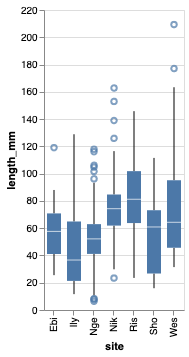

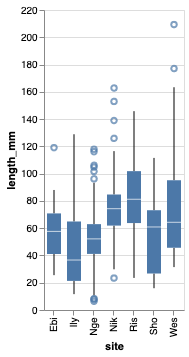

In [46]:
alt.Chart(dfcrocea).mark_boxplot().encode(
    alt.X("site"),
    y='length_mm',
)

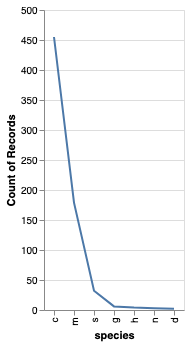

In [38]:
#df['logbnoa'] = spsp.logit(df['b_noa'])
df['logbnoa'] = spsp.logit(df['b_noa'])


#Whittaker plot, species rank abundance

alt.Chart(df).mark_line().encode(
    y='count(species)',
    x=alt.X(
        'species',
        sort=alt.EncodingSortField(
            field="species",  # The field to use for the sort
            op="count",  # The operation to run on the field prior to sorting
            order="descending"  # The order to sort in
        )
    )
)


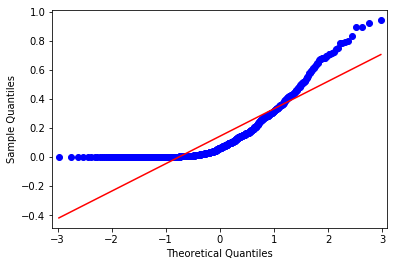

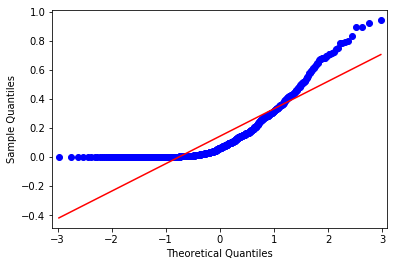

In [187]:
#qqplot(df1['length_mm'], line='s')

qqplot(df['b_noa'], line='s')

In [14]:
###Shapiro-Wilk test
from scipy.stats import shapiro

stat, p1 = shapiro(df1['length_mm'])
print('Statistics=%.3f, p=%.3f' % (stat, p1))
# interpret
alpha = 0.05
if p1 > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

Statistics=0.835, p=0.000
Sample does not look Gaussian (reject H0)


In [15]:
###Normality test
from scipy.stats import normaltest

stat, p2 = normaltest(df1['length_mm'])
print('Statistics=%.3f, p=%.3f' % (stat, p2))
# interpret
alpha = 0.05
if p2 > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

Statistics=425.565, p=0.000
Sample does not look Gaussian (reject H0)


In [16]:
###Real normality tests tooooo
result = anderson(df1['length_mm'])
print('Statistic: %.3f' % result.statistic)
p = 0
for i in range(len(result.critical_values)):
	sl, cv = result.significance_level[i], result.critical_values[i]
	if result.statistic < result.critical_values[i]:
		print('%.3f: %.3f, data looks normal (fail to reject H0)' % (sl, cv))
	else:
		print('%.3f: %.3f, data does not look normal (reject H0)' % (sl, cv))

Statistic: 19.918
15.000: 0.573, data does not look normal (reject H0)
10.000: 0.653, data does not look normal (reject H0)
5.000: 0.783, data does not look normal (reject H0)
2.500: 0.913, data does not look normal (reject H0)
1.000: 1.086, data does not look normal (reject H0)


In [36]:
###If not normal use non-parametric tests
countsite = df['site'].value_counts()
countsite

Nik    166
Nge    113
Ily    108
Wes     86
Ris     59
Ebi     41
Ang     38
Sho     36
Arc     22
Kay     12
Name: site, dtype: int64

In [37]:
###Mann-whitney non-para test
data1 = df1['length_mm']
stat, p = mannwhitneyu(data1, countsite)
p

0.20178221678410369

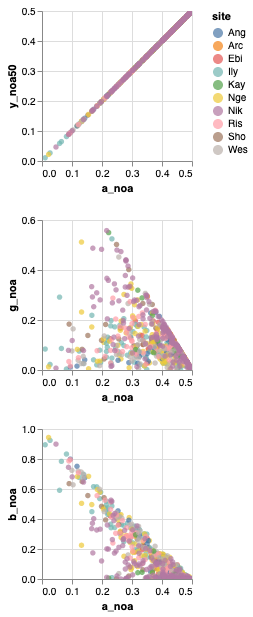

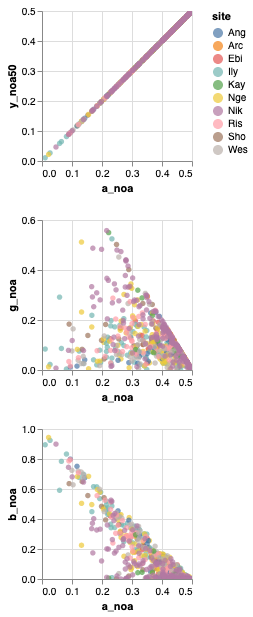

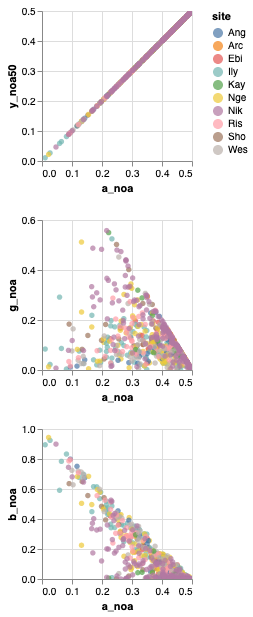

In [188]:
####PLOTTTING


alt.Chart(df).mark_circle().encode(
    alt.X(alt.repeat("column"), type='quantitative'),
    alt.Y(alt.repeat("row"), type='quantitative'),
    color='site'
).properties(
    width=150,
    height=150
).repeat(
    row=['y_noa50', 'g_noa', 'b_noa'],
    column=['a_noa']
).interactive()

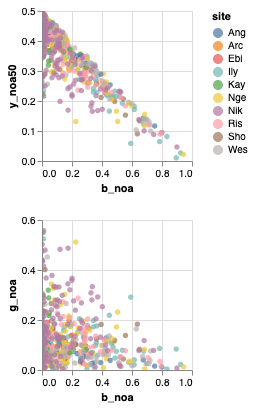

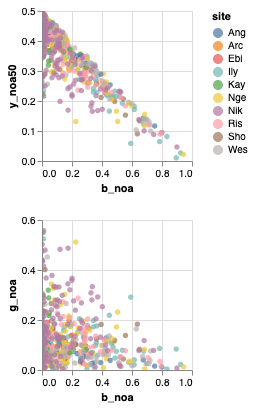

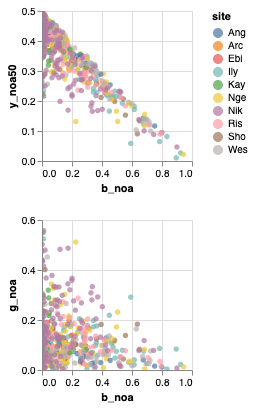

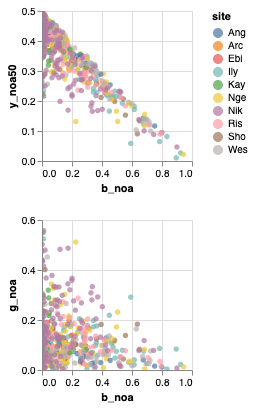

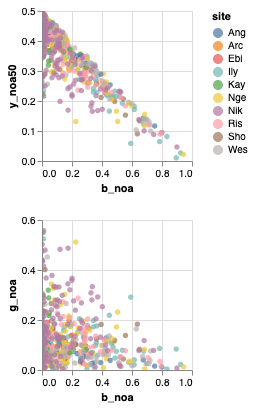

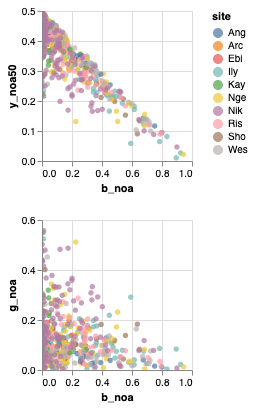

In [233]:
alt.Chart(df).mark_circle().encode(
    alt.X(alt.repeat("column"), type='quantitative'),
    alt.Y(alt.repeat("row"), type='quantitative'),
    color='site'
).properties(
    width=150,
    height=150
).repeat(
    row=['y_noa50','g_noa'],
    column=['b_noa']
).interactive()

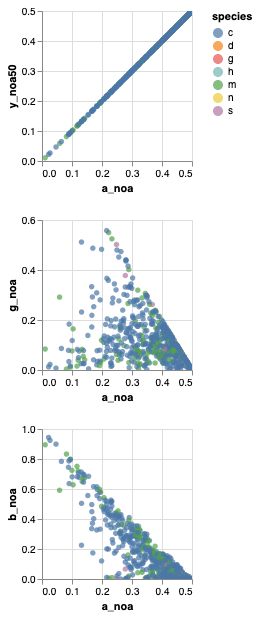

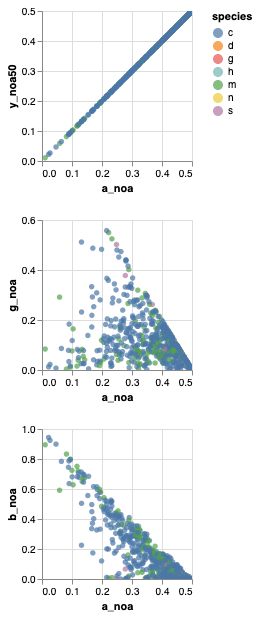

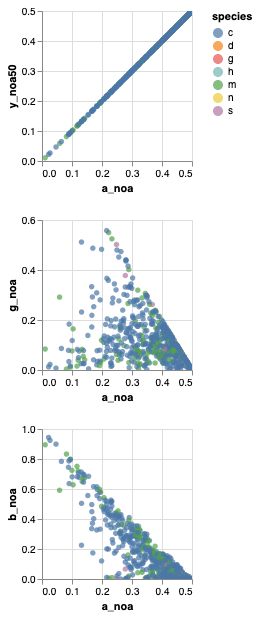

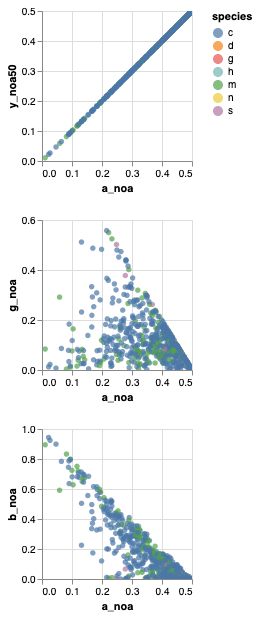

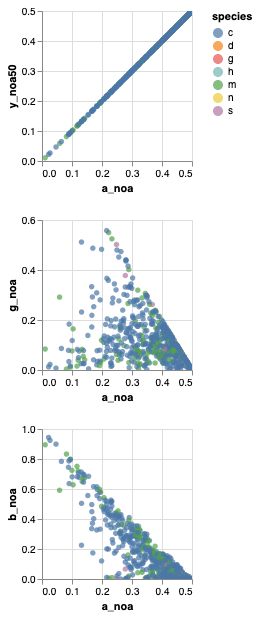

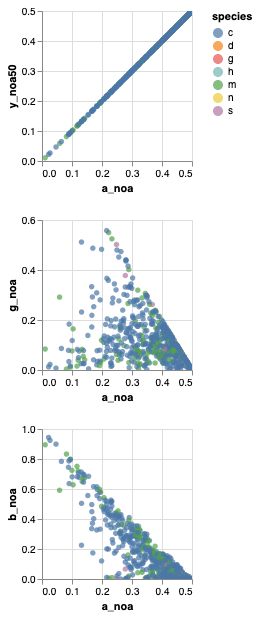

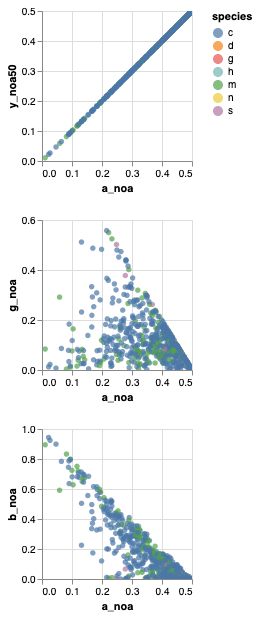

In [103]:
alt.Chart(df).mark_circle().encode(
    alt.X(alt.repeat("column"), type='quantitative'),
    alt.Y(alt.repeat("row"), type='quantitative'),
    color='species'
).properties(
    width=150,
    height=150
).repeat(
    row=['y_noa50', 'g_noa', 'b_noa'],
    column=['a_noa']
).interactive()

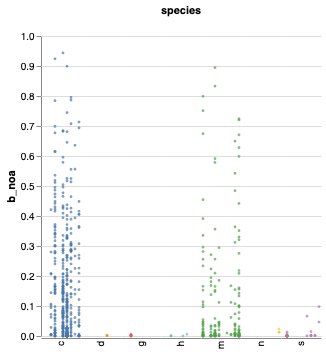

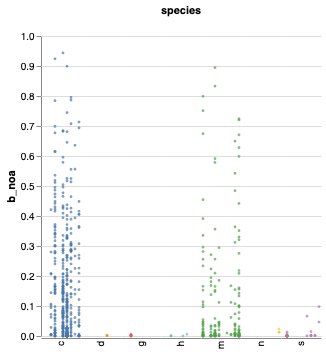

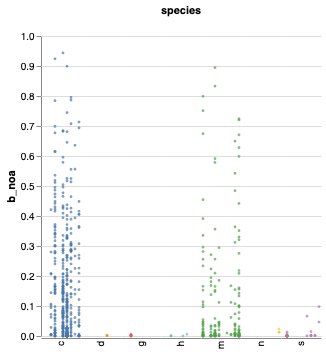

In [101]:

stripplot =  alt.Chart(df, width=40).mark_circle(size=8).encode(
    x=alt.X(
        'site',
        title=None,
        axis=alt.Axis(values=[0], ticks=True, grid=False, labels=False),
        scale=alt.Scale(),
    ),
    y=alt.Y('b_noa'),
    color=alt.Color('species', legend=None),
    column=alt.Column(
        'species',
        header=alt.Header(
            labelAngle=-90,
            titleOrient='top',
            labelOrient='bottom',
            labelAlign='right',
            labelPadding=3,
        ),
    ),
).transform_calculate(
    # Generate Gaussian jitter with a Box-Muller transform
    jitter='sqrt(-2*log(random()))*cos(2*PI*random())'
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
)

stripplot

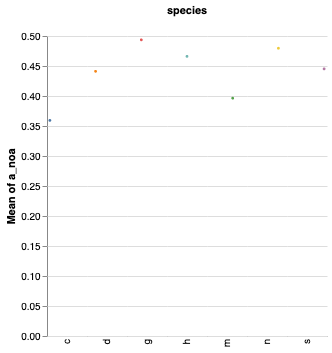

In [54]:

stripplot2 =  alt.Chart(df, width=40).mark_circle(size=8).encode(
    x=alt.X(
        'species',
        title=None,
        axis=alt.Axis(values=[0], ticks=True, grid=False, labels=False),
        scale=alt.Scale(),
    ),
    y=alt.Y('mean(a_noa)'),
    color=alt.Color('species', legend=None),
    column=alt.Column(
        'species',
        header=alt.Header(
            labelAngle=-90,
            titleOrient='top',
            labelOrient='bottom',
            labelAlign='right',
            labelPadding=3,
        ),
    ),
).transform_calculate(
    # Generate Gaussian jitter with a Box-Muller transform
    jitter='sqrt(-2*log(random()))*cos(2*PI*random())'
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
)

stripplot2

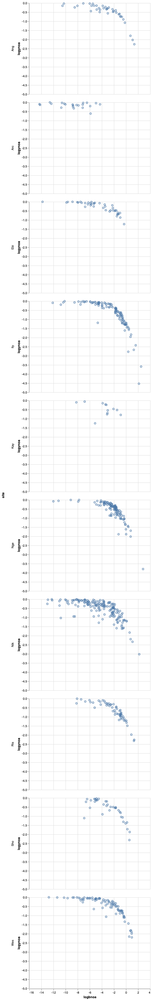

In [107]:
df['logbnoa'] = spsp.logit(df['b_noa'])
df['logynoa'] = spsp.logit(df['y_noa50'])

###logBlue v logyellow color per site
alt.Chart(df).mark_point().encode(
    x='logbnoa',
    y='logynoa',
    row='site'
)

In [108]:
###Blue v yellow color per site
alt.Chart(df).mark_bar().encode(
    x=alt.X('length_mm',bin=alt.Bin(maxbins=15))
    y='count()',
    column='site'
).properties(width = 100, height = 100)

SyntaxError: invalid syntax (<ipython-input-108-9c25f9f77484>, line 4)

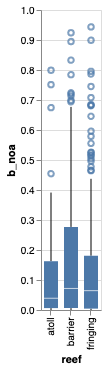

In [147]:
###algae v blue per site
###Blue v yellow color per site
yellowsite = alt.Chart(df).mark_boxplot().encode(
    x='reef',
    y='b_noa')
yellowsite



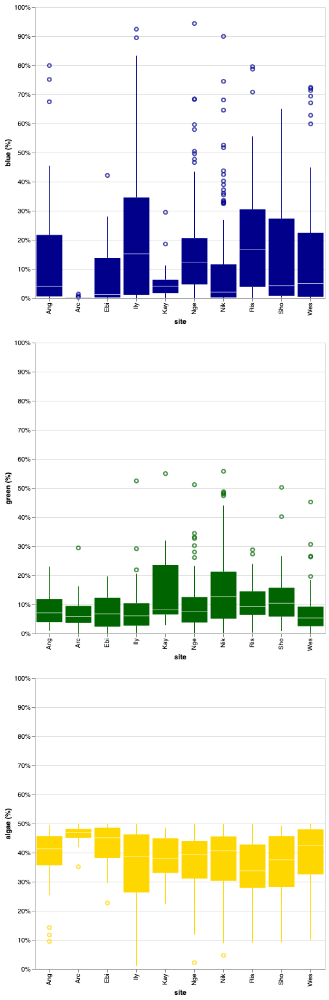

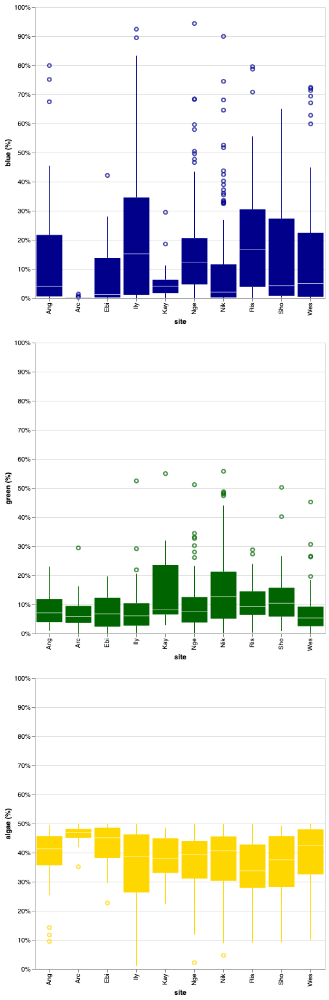

In [32]:
bluespecies = alt.Chart(df).mark_boxplot(color = 'darkblue').encode(
    alt.X('site'),
    alt.Y('b_noa', axis=alt.Axis(format='%',title='blue (%)'),scale=alt.Scale(domain=[0, 1]))).properties(
    width=450,
    height=450)
greenspecies = alt.Chart(df).mark_boxplot(color = 'darkgreen').encode(
    alt.X('site'),
    alt.Y('g_noa', axis=alt.Axis(format='%',title='green (%)'),scale=alt.Scale(domain=[0, 1]))).properties(
    width=450,
    height=450)
algaespecies = alt.Chart(df).mark_boxplot(color = 'gold').encode(
    alt.X('site'),
    alt.Y('a_noa', axis=alt.Axis(format='%',title='algae (%)'),scale=alt.Scale(domain=[0, 1]))).properties(
    width=450,
    height=450)

lengthalgae_scatterbar = ((bluespecies & greenspecies & algaespecies).configure_boxplot(size = 40))
lengthalgae_scatterbar

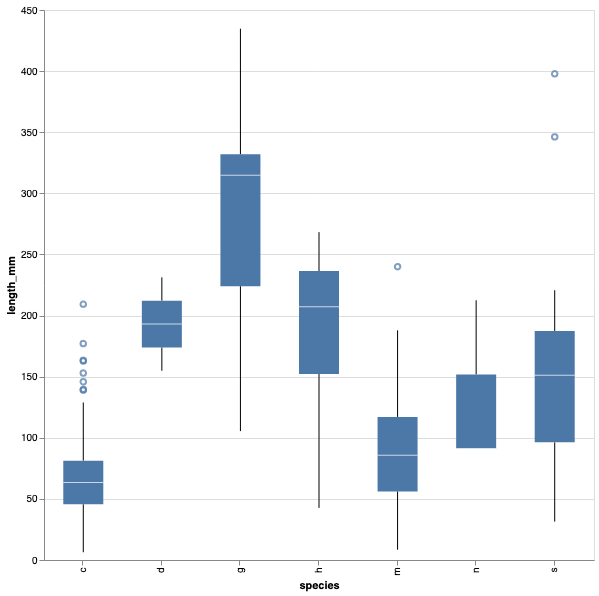

In [114]:
###Box plot with whiskers
import altair as alt
alt.renderers.enable('notebook')
sitelength = alt.Chart(df).mark_boxplot().encode(
    x='species',
    y='length_mm').properties(width = 550, height = 550).configure_boxplot(size = 40)
sitelength

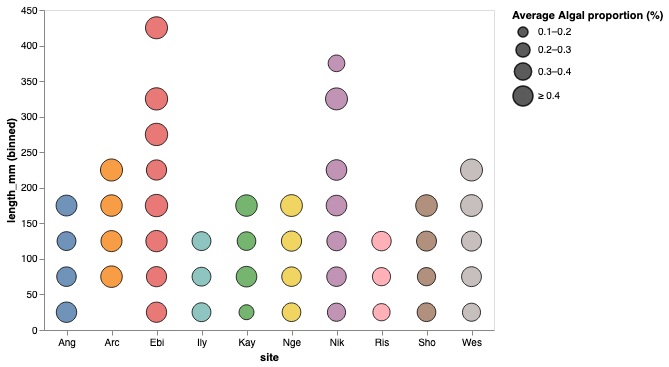

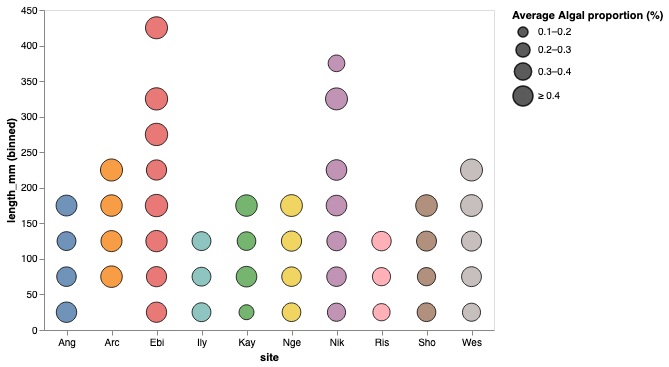

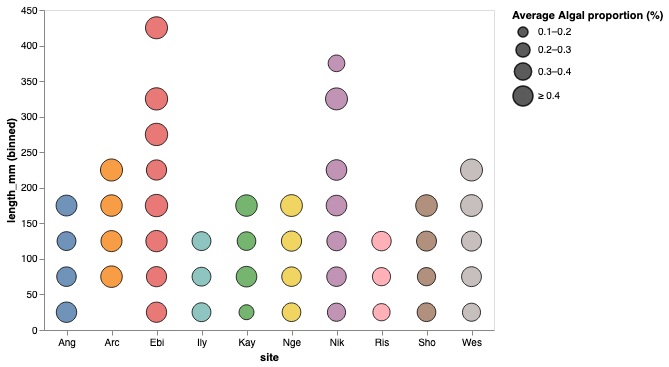

In [122]:
###Cool bin plot
alt.Chart(df).mark_circle(
    opacity=0.8,
    stroke='black',
    strokeWidth=1
).encode(
    alt.X('site', axis=alt.Axis(labelAngle=0)),
    alt.Y('length_mm',bin=alt.Bin(maxbins=15)),
    alt.Size('mean(a_noa)',
        scale=alt.Scale(range=[0, 500]),
        bin=alt.Bin(maxbins = 5),
        legend=alt.Legend(title='Average Algal proportion (%)')
    ),
    alt.Color('site', legend=None)
).properties(
    width=450,
    height=320
)

In [49]:

###Real normality tests tooooo
result = anderson(dfcrocea['length_mm'])
print('Statistic: %.3f' % result.statistic)
p = 0
for i in range(len(result.critical_values)):
	sl, cv = result.significance_level[i], result.critical_values[i]
	if result.statistic < result.critical_values[i]:
		print('%.3f: %.3f, data looks normal (fail to reject H0)' % (sl, cv))
	else:
		print('%.3f: %.3f, data does not look normal (reject H0)' % (sl, cv))

Statistic: 1.164
15.000: 0.571, data does not look normal (reject H0)
10.000: 0.650, data does not look normal (reject H0)
5.000: 0.780, data does not look normal (reject H0)
2.500: 0.910, data does not look normal (reject H0)
1.000: 1.083, data does not look normal (reject H0)


In [72]:
dfcrocea1

,filename,loc,transect,species,habitat,speciescode,length_mm,viscol,rcenter,gcenter,...,percneu,percblack,reef,predcolor,viscol.1,blurryyes0,prediridrating0to4,Evfinal,depth,depthhist
64,CLM_0340,Ebi,1.0,c,barrier,1,86.89,blue,0.355,0.310,...,66.126959,0.0,outer,yellow,blue,1,0,15.044736,0.831627,2
66,CLM_0340,Ebi,1.0,c,barrier,1,88.02,blue,0.410,0.310,...,40.239522,0.0,outer,blue1,blue,1,4,15.044736,0.827201,2
67,CLM_0341,Ebi,1.0,c,barrier,1,11.81,blue,0.345,0.375,...,46.836582,0.0,outer,blue,blue,0,0,15.044736,0.858854,2
68,CLM_0343,Ebi,1.0,c,barrier,1,35.41,blue,0.380,0.300,...,57.759610,0.0,outer,blue,blue,1,3,15.044736,0.180495,1
69,CLM_0345,Ebi,1.0,c,barrier,1,51.59,yellow_blue,0.385,0.400,...,41.660075,0.0,outer,yellow1,yellow and blue,0,0,15.044736,1.149511,2
73,CLM_0349,Ebi,1.0,c,barrier,1,20.18,blue,0.350,0.400,...,43.240427,0.0,outer,yellow and blue,blue,0,0,15.044736,1.285381,3
76,CLM_0358,Ebi,1.0,c,barrier,1,40.85,yellow,0.405,0.455,...,2.778646,0.0,outer,yellow1,yellow,1,2,14.722346,-0.471617,1
77,CLM_0359,Ebi,1.0,c,barrier,1,58.43,blue,0.385,0.415,...,28.511364,0.0,outer,yellow and blue,blue,0,0,14.722346,1.032329,2
78,CLM_0359,Ebi,1.0,c,barrier,1,31.68,blue,0.375,0.395,...,42.115825,0.0,outer,yellow and blue,blue,0,0,14.722346,1.629520,3
83,CLM_0366,Ebi,1.0,c,barrier,1,82.77,blue,0.360,0.395,...,39.820411,0.0,outer,yellow1,blue,1,0,14.722346,0.766302,2


(array([173., 328., 119.,  37.,  13.,   4.,   1.,   4.,   0.,   2.]),
 array([  6.35 ,  49.187,  92.024, 134.861, 177.698, 220.535, 263.372,
        306.209, 349.046, 391.883, 434.72 ]),
 <a list of 10 Patch objects>)

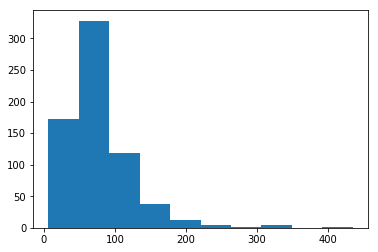

In [29]:
### Let's take a look at the histogram to see distribution of data

plt.hist(df['length_mm'])


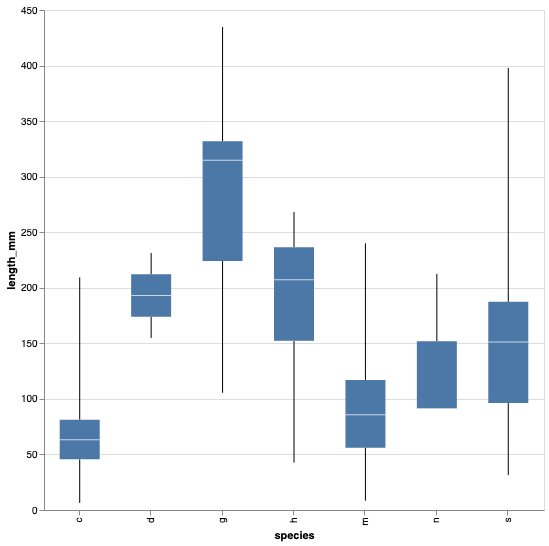

In [82]:
### Box and whiskers plot site v length of T.crocea

alt.renderers.enable('notebook')
specieslength = alt.Chart(df).mark_boxplot(extent='min-max').encode(
    x='species',
    y='length_mm').properties(width = 500, height = 500).configure_boxplot(size = 40)

specieslength


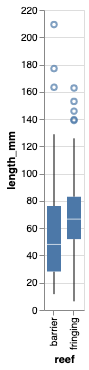

In [148]:
### Box and whiskers plot reef v length of T.crocea

alt.renderers.enable('notebook')
sitelength1 = alt.Chart(dfcrocea).mark_boxplot().encode(
    x='reef',
    y='length_mm')
sitelength1

In [51]:
#Okay version of an ANOVA, see next steps
stat1, p3 = f_oneway(dfcrocea1['length_mm'],dfcrocea2['length_mm'])
print('Statistics=%.3f, p=%.3f' % (stat1, p3))
# interpret
alpha = 0.05
if p3 > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

Statistics=41.935, p=0.000
Sample does not look Gaussian (reject H0)


In [176]:
###ANOVA length v reef of T.crocea


results = ols('length_mm ~ reef', data=dfcrocea).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              length_mm   R-squared:                       0.035
Model:                            OLS   Adj. R-squared:                  0.033
Method:                 Least Squares   F-statistic:                     16.44
Date:                Thu, 08 Aug 2019   Prob (F-statistic):           5.92e-05
Time:                        16:27:58   Log-Likelihood:                -2174.0
No. Observations:                 455   AIC:                             4352.
Df Residuals:                     453   BIC:                             4360.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           56.1890      2.500     22.479      0.000      51.277      61.101
reef[T.fringing]    12.0464      2.971      4.054      0.000       6.207      17.886
==============================================================================
Omnibus:                       77.302   Durbin-Watson:                   1.555
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              166.683
Skew:                           0.904   Prob(JB):                     6.39e-37
Kurtosis:                       5.350   Cond. No.                         3.47
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [150]:
###ANOVA length v location of T.crocea

results2 = ols('length_mm ~ site', data=dfcrocea).fit()
results2.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              length_mm   R-squared:                       0.203
Model:                            OLS   Adj. R-squared:                  0.192
Method:                 Least Squares   F-statistic:                     19.03
Date:                Tue, 06 Aug 2019   Prob (F-statistic):           8.90e-20
Time:                        16:08:04   Log-Likelihood:                -2130.5
No. Observations:                 455   AIC:                             4275.
Df Residuals:                     448   BIC:                             4304.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      58.2653      6.802      8.567      0.000      44.899      71.632
site[T.Ily]   -12.7557      7.459     -1.710      0.088     -27.415       1.903
site[T.Nge]    -5.0751      7.243     -0.701      0.484     -19.309       9.159
site[T.Nik]    16.7774      7.113      2.359      0.019       2.798      30.757
site[T.Ris]    21.8879      7.755      2.822      0.005       6.647      37.128
site[T.Sho]    -1.5517     10.457     -0.148      0.882     -22.102      18.999
site[T.Wes]    20.7528      8.203      2.530      0.012       4.632      36.874
==============================================================================
Omnibus:                       71.815   Durbin-Watson:                   1.890
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              134.023
Skew:                           0.901   Prob(JB):                     7.89e-30
Kurtosis:                       4.954   Cond. No.                         16.7
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [53]:
aov_table = sm.stats.anova_lm(results, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
reef,33052.774040,1.0,41.935017,2.460106e-10
Residual,357050.212826,453.0,NaN,NaN


In [54]:
results.diagn

{'jb': 117.62054086694101,
 'jbpv': 2.8775579038267265e-26,
 'skew': 0.8447890905267443,
 'kurtosis': 4.830160093403059,
 'omni': 65.43596946335404,
 'omnipv': 6.176746417858696e-15,
 'condno': 4.052257609951126,
 'mineigval': 46.496164595132974}

In [92]:
##Test whether variance comes from same population, if p<0.05 then variance is homogeneous

stats.levene(df.a_noa.dropna(), df.b_noa.dropna())

LeveneResult(statistic=53.65136070120835, pvalue=4.087114320702907e-13)

In [55]:
from scipy.stats import shapiro

# normality test run on the residuals of the linear model data (T.crocea length)
stats.shapiro(results.resid)
#Not normally distributed because rejected null hypothesis (2nd value)

(0.9645994901657104, 5.129053626262703e-09)

In [56]:
#non-parametric test  Mann Whitney U test (doesn't assume balance)
stat, p = mannwhitneyu((dfcrocea_length_hab.reef =='fringing'), (dfcrocea_length_hab.reef =='barrier'))
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Same distribution (fail to reject H0)')
else:
	print('Different distribution (reject H0)')


Statistics=45500.000, p=0.000
Different distribution (reject H0)


In [48]:
# compare algae with Kruskal Wallis to compare species

stat, p = kruskal((dfspecieslength.site =='Arc'), (dfspecieslength.site =='Ang'),(dfspecieslength.site =='Ebi'),(dfspecieslength.site =='Ily'),(dfspecieslength.site =='Kay'),(dfspecieslength.site =='Nge'),(dfspecieslength.site =='Nik'),(dfspecieslength.site =='Ris'),(dfspecieslength.site =='Sho'),(dfspecieslength.site =='Wes'))
# interpret
alpha = 0.05
if p > alpha:
	print('Same distributions (fail to reject H0)')
else:
	print('Different distributions (reject H0)')
print('Statistics=%.3f, p=%.3f' % (stat, p))

Different distributions (reject H0)
Statistics=351.374, p=0.000


In [22]:
# compare algae with Kruskal Wallis to compare species

stat1, p1 = kruskal((dfspeciesblue.site =='Arc'), (dfspeciesblue.site =='Ang'),(dfspeciesblue.site =='Ebi'),(dfspeciesblue.site =='Ily'),(dfspeciesblue.site =='Kay'),(dfspeciesblue.site =='Nge'),(dfspeciesblue.site =='Nik'),(dfspeciesblue.site =='Ris'),(dfspeciesblue.site =='Sho'),(dfspeciesblue.site =='Wes'))
# interpret
alpha = 0.05
if p1 > alpha:
	print('Same distributions (fail to reject H0)')
else:
	print('Different distributions (reject H0)')
print('Statistics=%.3f, p=%.3f' % (stat1, p1))

Different distributions (reject H0)
Statistics=351.374, p=0.000


In [23]:
# compare algae with Kruskal Wallis to compare species

stat, p = kruskal((dfspeciesgreen.site =='Arc'), (dfspeciesgreen.site =='Ang'),(dfspeciesgreen.site =='Ebi'),(dfspeciesgreen.site =='Ily'),(dfspeciesgreen.site =='Kay'),(dfspeciesgreen.site =='Nge'),(dfspeciesgreen.site =='Nik'),(dfspeciesgreen.site =='Ris'),(dfspeciesgreen.site =='Sho'),(dfspeciesgreen.site =='Wes'))
# interpret
alpha = 0.05
if p > alpha:
	print('Same distributions (fail to reject H0)')
else:
	print('Different distributions (reject H0)')
print('Statistics=%.3f, p=%.3f' % (stat, p))


Different distributions (reject H0)
Statistics=351.374, p=0.000


In [59]:
# compare algae with Kruskal Wallis to compare species

stat, p = kruskal((dfspeciesgreen.species =='n'), (dfspeciesgreen.species =='m'))
# interpret
alpha = 0.05
if p > alpha:
	print('Same distributions (fail to reject H0)')
else:
	print('Different distributions (reject H0)')
print('Statistics=%.3f, p=%.3f' % (stat, p))

Different distributions (reject H0)
Statistics=196.304, p=0.000


In [41]:
# compare blue with Kruskal Wallis to compare species

stat1, p1 = kruskal((dfspeciesblue.species =='c'), (dfspeciesblue.species =='m'),(dfspeciesblue.species =='s'),(dfspeciesblue.species =='d'),(dfspeciesblue.species =='g'),(dfspeciesblue.species =='n'),(dfspeciesblue.species =='h'))
# interpret
alpha = 0.05
if p1 > alpha:
	print('Same distributions (fail to reject H0)')
else:
	print('Different distributions (reject H0)')
print('Statistics=%.3f, p=%.3f' % (stat1, p1))


Different distributions (reject H0)
Statistics=2085.042, p=0.000


In [41]:
#Dunn post hoc on KW test of agale v site

sp.posthoc_dunn(dfcrocea, val_col='a_noa', group_col='site')

,Ebi,Ily,Nge,Nik,Ris,Sho,Wes
Ebi,-1.000000,0.073243,0.394433,0.627883,0.023818,0.053177,0.514689
Ily,0.073243,-1.000000,0.068317,0.007428,0.387764,0.420552,0.145974
Nge,0.394433,0.068317,-1.000000,0.401956,0.011239,0.091407,0.874630
Nik,0.627883,0.007428,0.401956,-1.000000,0.000971,0.041111,0.706448
Ris,0.023818,0.387764,0.011239,0.000971,-1.000000,0.759003,0.039218
Sho,0.053177,0.420552,0.091407,0.041111,0.759003,-1.000000,0.104859
Wes,0.514689,0.145974,0.874630,0.706448,0.039218,0.104859,-1.000000


In [42]:
#Dunn post hoc on KW test of blue v site

sp.posthoc_dunn(dfcrocea, val_col='b_noa', group_col='site')

,Ebi,Ily,Nge,Nik,Ris,Sho,Wes
Ebi,-1.000000,4.601698e-02,3.029420e-01,1.972703e-01,4.522222e-02,0.099574,0.532806
Ily,0.046017,-1.000000e+00,6.001475e-02,8.280795e-11,8.932318e-01,0.783506,0.076535
Nge,0.302942,6.001475e-02,-1.000000e+00,2.975862e-07,7.171337e-02,0.240935,0.653169
Nik,0.197270,8.280795e-11,2.975862e-07,-1.000000e+00,7.136057e-09,0.001307,0.004554
Ris,0.045222,8.932318e-01,7.171337e-02,7.136057e-09,-1.000000e+00,0.847101,0.077973
Sho,0.099574,7.835064e-01,2.409350e-01,1.307355e-03,8.471012e-01,-1.000000,0.186869
Wes,0.532806,7.653515e-02,6.531686e-01,4.554266e-03,7.797277e-02,0.186869,-1.000000


In [43]:
#Dunn post hoc on KW test of green v site

sp.posthoc_dunn(dfcrocea, val_col='g_noa', group_col='site')

,Ebi,Ily,Nge,Nik,Ris,Sho,Wes
Ebi,-1.000000,0.346178,0.637972,0.219647,0.616015,0.220892,0.228156
Ily,0.346178,-1.000000,0.359140,0.000021,0.023600,0.019846,0.604127
Nge,0.637972,0.359140,-1.000000,0.000184,0.103382,0.051491,0.214422
Nik,0.219647,0.000021,0.000184,-1.000000,0.256574,0.620163,0.000219
Ris,0.616015,0.023600,0.103382,0.256574,-1.000000,0.309712,0.019728
Sho,0.220892,0.019846,0.051491,0.620163,0.309712,-1.000000,0.013374
Wes,0.228156,0.604127,0.214422,0.000219,0.019728,0.013374,-1.000000


In [49]:
#Dunn post hoc on KW test of agale v site

sp.posthoc_dunn(dfcrocea, val_col='length_mm', group_col='site')

,Ebi,Ily,Nge,Nik,Ris,Sho,Wes
Ebi,-1.000000,1.281793e-01,5.187874e-01,1.116696e-02,5.576081e-03,0.946585,0.127116
Ily,0.128179,-1.000000e+00,9.076529e-02,2.052627e-15,9.735666e-12,0.156956,0.000015
Nge,0.518787,9.076529e-02,-1.000000e+00,2.533877e-12,5.205117e-09,0.518532,0.000987
Nik,0.011167,2.052627e-15,2.533877e-12,-1.000000e+00,4.195274e-01,0.034612,0.271756
Ris,0.005576,9.735666e-12,5.205117e-09,4.195274e-01,-1.000000e+00,0.017774,0.128512
Sho,0.946585,1.569564e-01,5.185318e-01,3.461168e-02,1.777416e-02,-1.000000,0.197702
Wes,0.127116,1.508371e-05,9.873560e-04,2.717557e-01,1.285122e-01,0.197702,-1.000000


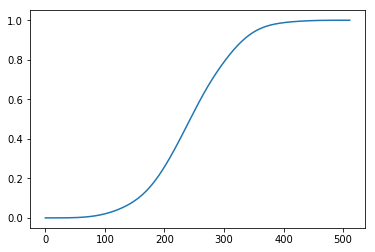

In [58]:
dens = sm.nonparametric.KDEUnivariate(np.random.normal(dfcrocea_length_bar))

dens.fit()
plt.plot(dens.cdf)
plt.show()


In [72]:
#attempt to use Kernel density to test non-parametric significance
>>> import statsmodels.api as sm
dens = sm.nonparametric.KDEMultivariate(data = [(dfcrocea_length_hab.reef =='fringing'), (dfcrocea_length_hab.reef =='barrier')], var_type='cc', bw='normal_reference')

dens


KDE instance
Number of variables: k_vars = 2
Number of samples:   nobs = 455
Variable types:      cc
BW selection method: normal_reference

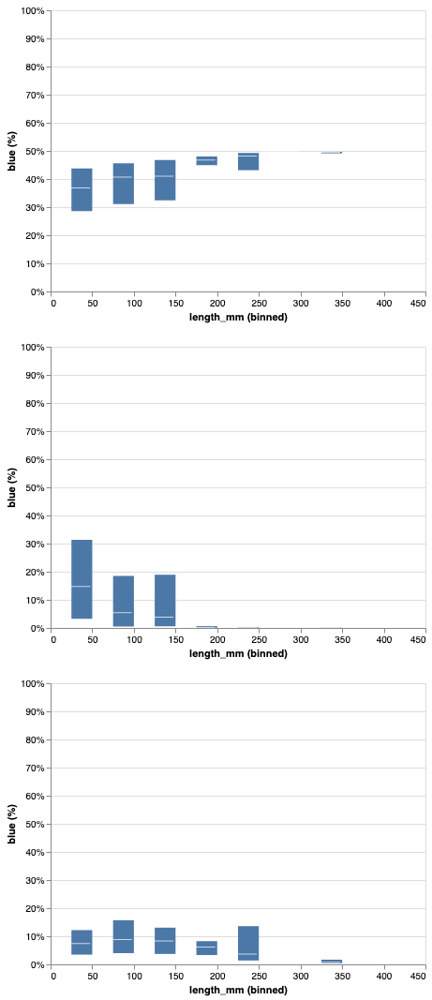

In [155]:
cralgae = alt.Chart(df).mark_boxplot().encode(
    alt.X('length_mm', bin=alt.Bin(maxbins=20)),
    alt.Y('a_noa', axis=alt.Axis(format='%',title='blue (%)'),scale=alt.Scale(domain=[0, 1])))

crblue = alt.Chart(df).mark_boxplot().encode(
    alt.X('length_mm', bin=alt.Bin(maxbins=20)),
    alt.Y('b_noa', axis=alt.Axis(format='%',title='blue (%)'),scale=alt.Scale(domain=[0, 1])))

crgreen = alt.Chart(df).mark_boxplot().encode(
    alt.X('length_mm', bin=alt.Bin(maxbins=20)),
    alt.Y('g_noa', axis=alt.Axis(format='%',title='blue (%)'),scale=alt.Scale(domain=[0, 1])))

cr_scatterbar = ((cralgae & crblue & crgreen).configure_boxplot(size = 40))
cr_scatterbar

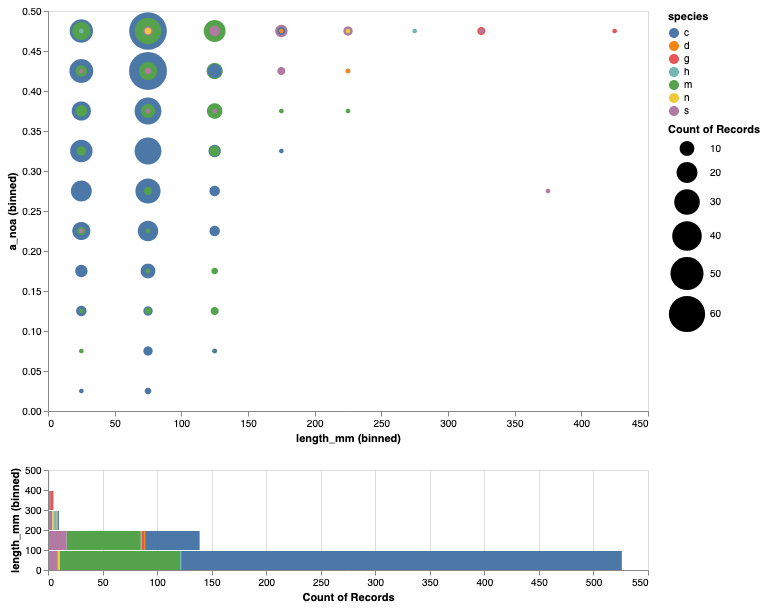

In [157]:
chart1 = alt.Chart(df).mark_circle().encode(
    alt.X('length_mm', bin=alt.Bin(maxbins=15)),
    alt.Y('a_noa', bin=True),
    size='count()',
    color='species'
    ).properties(
    height=400,
    width=600
    )

chart2 = alt.Chart(df).mark_bar().encode(
    x='count()',
    y=alt.Y('length_mm', bin=alt.Bin(maxbins=8)),
    color='species'
).properties(
    height=100,
    width=600
)

alt.vconcat(chart1, chart2, data=df)

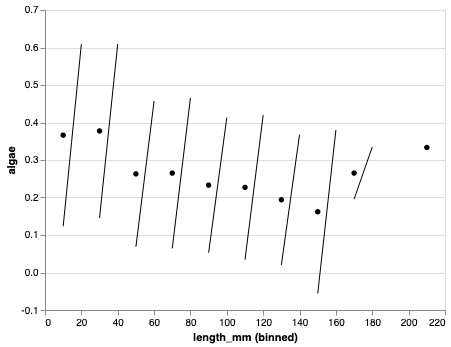

In [119]:
error_bars = alt.Chart(dfcrocea).mark_errorbar(extent='stdev').encode(
  x=alt.X('length_mm', bin=alt.Bin(maxbins=15),scale=alt.Scale(zero=False)),
  y='mean(algae)'
)

points = alt.Chart(dfcrocea).mark_point(filled=True, color='black').encode(
  x=alt.X('length_mm', bin=alt.Bin(maxbins=15)),
  y='mean(algae)',
)

error_bars + points




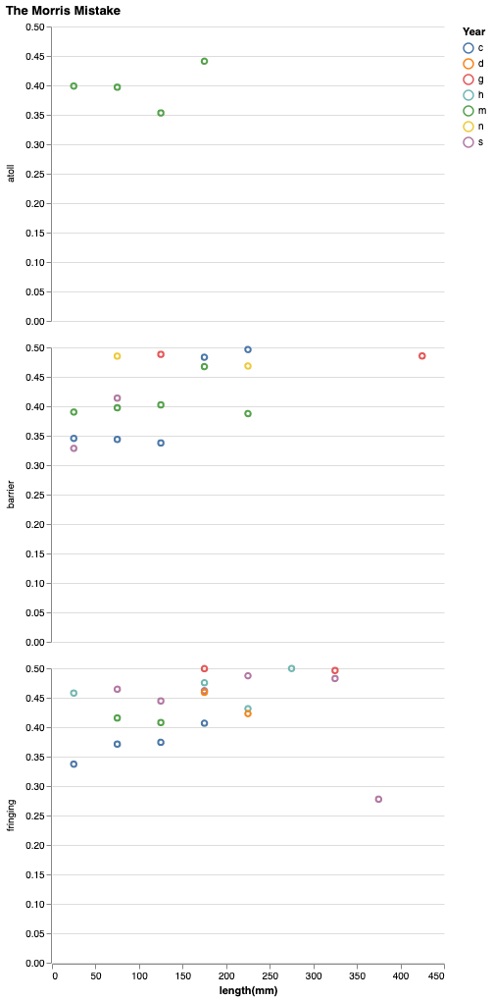

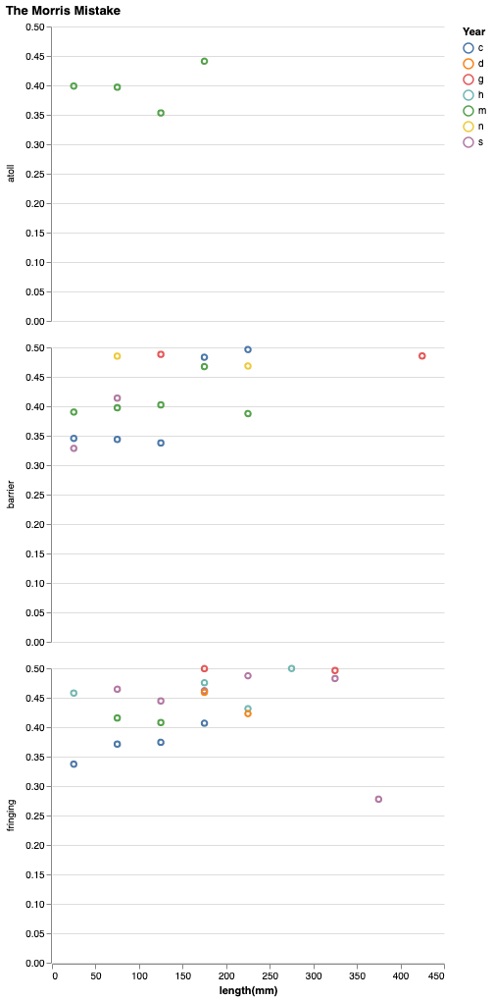

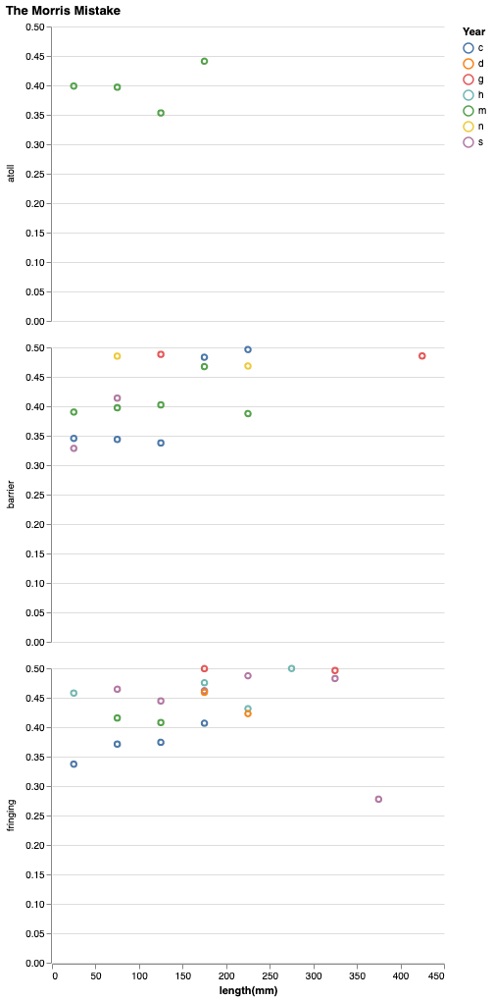

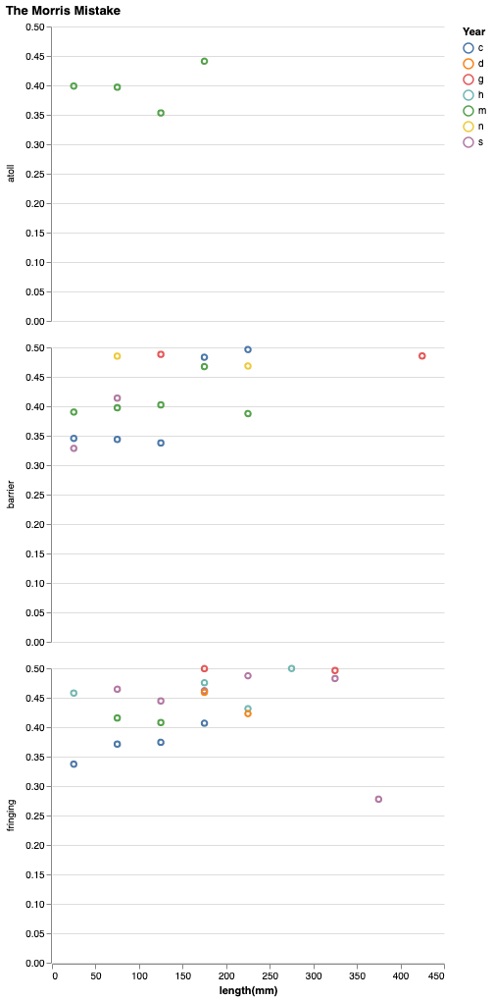

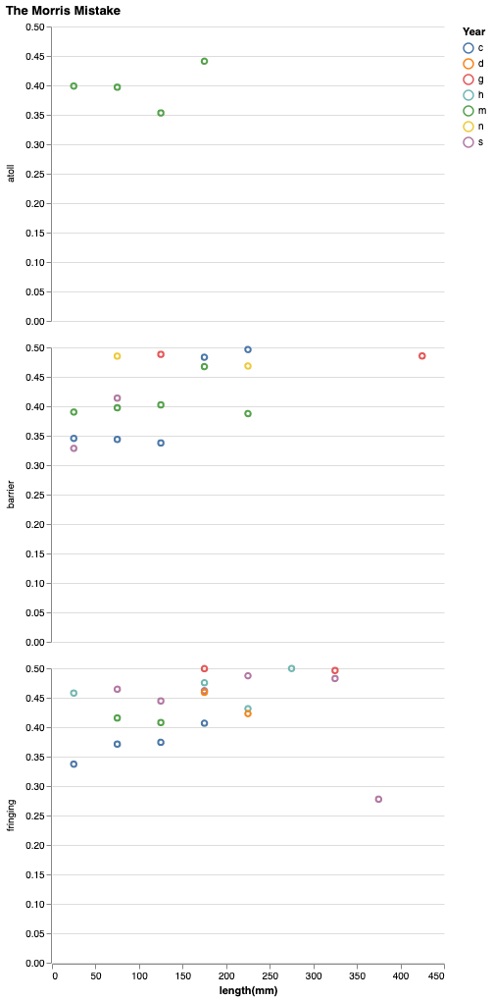

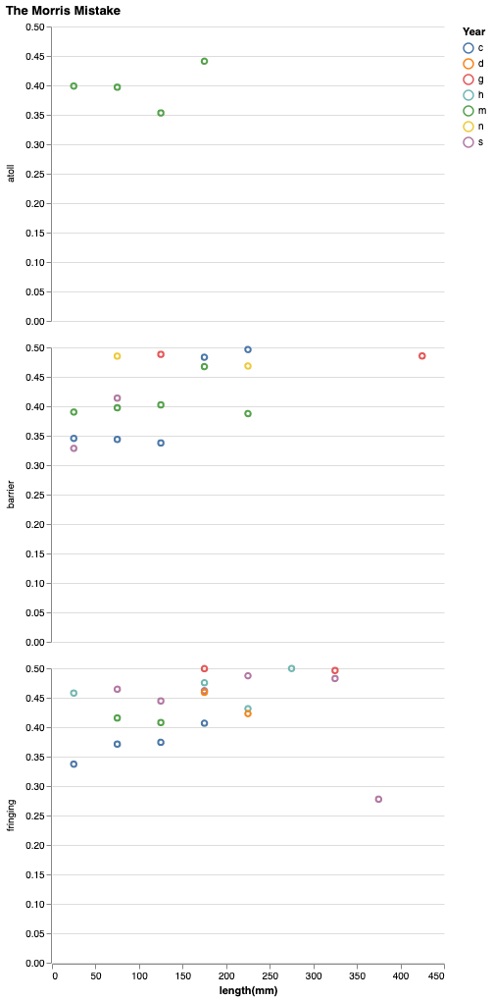

In [167]:
alt.Chart(df, title="The Morris Mistake").mark_point().encode(
    alt.X(
        'length_mm', bin=alt.Bin(maxbins=15),
        title="length(mm)",
        scale=alt.Scale(zero=False),
        axis=alt.Axis(grid=False)
    ),
    alt.Y(
        'mean(a_noa)',
        title="",
        scale=alt.Scale(rangeStep=20),
        axis=alt.Axis(grid=True)
    ),
    color=alt.Color('species', legend=alt.Legend(title="Year")),
    row=alt.Row(
        'reef',
        title="",
    )
).configure_view(stroke="transparent")




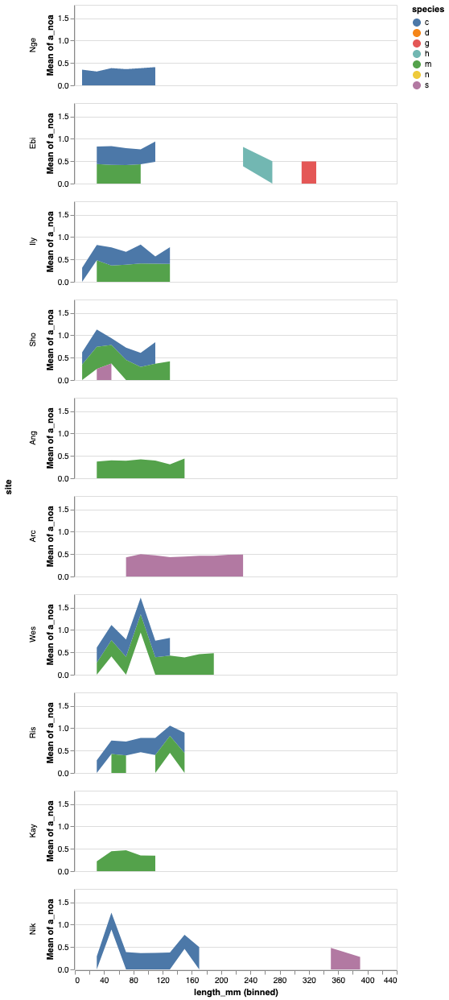

In [166]:
alt.Chart(df).transform_filter(
    alt.datum.symbol != 'GOOG'
).mark_area().encode(
    alt.X('length_mm', bin=alt.Bin(maxbins=25)),
    alt.Y('mean(a_noa)'),
    color='species',
    row=alt.Row('site', sort=['Ang', 'Arc', 'Ebi', 'Ily','Nge','Nik','Sho','Ris','Wes'])
).properties(height=100, width=400)

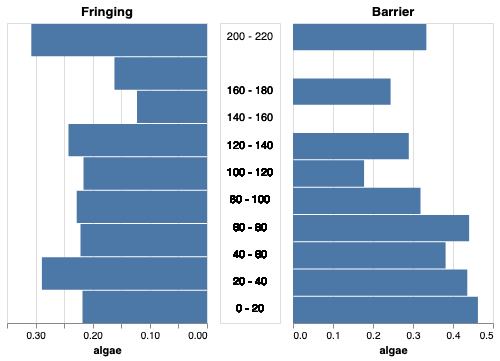

In [167]:
base = alt.Chart(dfcrocea).properties(
    width=200
)


left = base.transform_filter(
    alt.datum.reef == 'fringing'
).encode(
    y=alt.Y('length_mm', bin=alt.Bin(maxbins=15),axis=None),
    x=alt.X('mean(algae)',
            title='algae',
            sort=alt.SortOrder('descending'))
).mark_bar().properties(title='Fringing')

middle = base.encode(
    y=alt.Y('length_mm',bin=alt.Bin(maxbins=15), axis=None),text=alt.Text('length_mm',bin=alt.Bin(maxbins=15)),
).mark_text(limit = 70).properties(width=60)

right = base.transform_filter(
    alt.datum.reef == 'barrier'
).encode(
    y=alt.Y('length_mm', bin=alt.Bin(maxbins=15),axis=None),
    x=alt.X('mean(algae)', title='algae')
).mark_bar().properties(title='Barrier')


alt.concat(left, middle, right, spacing=10)

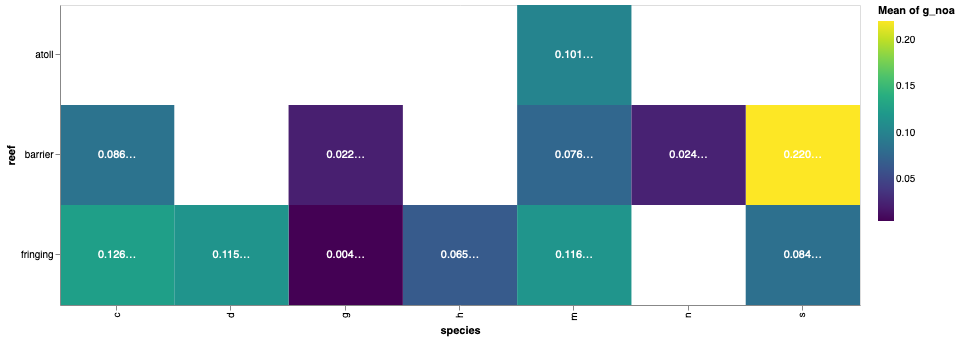

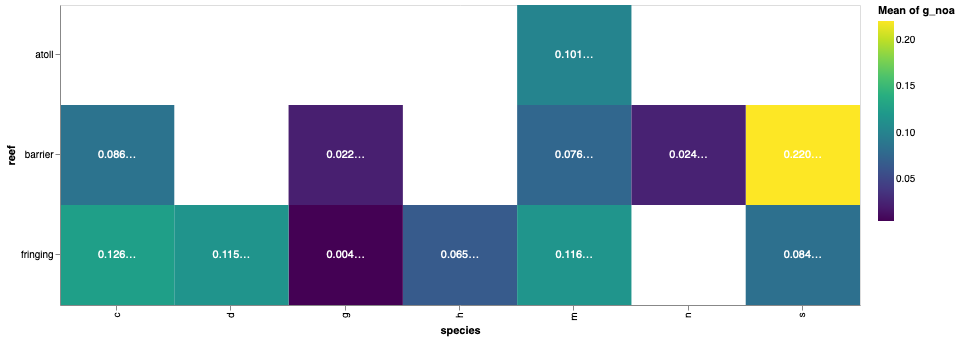

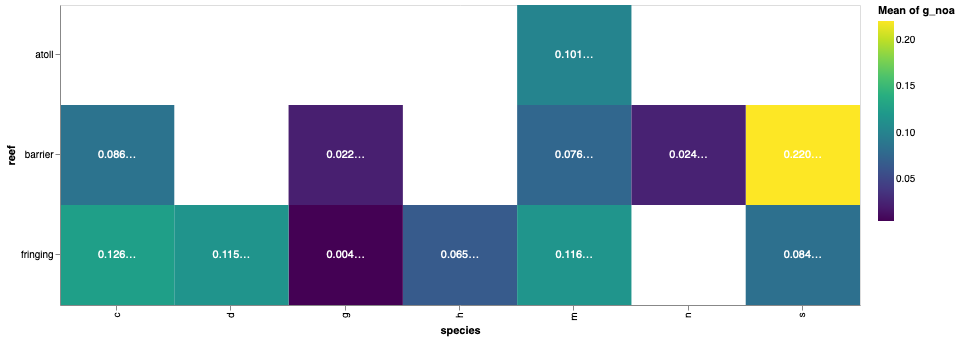

In [210]:
# Configure common options
base = alt.Chart(df).encode(
    alt.X('species', scale=alt.Scale(paddingInner=0)),
    alt.Y('reef', scale=alt.Scale(paddingInner=0)),
).properties(
    width = 800,
    height = 300
)

# Configure heatmap
heatmap = base.mark_rect().encode(
    color=alt.Color('mean(g_noa)',
        scale=alt.Scale(scheme='viridis'),
        legend=alt.Legend(direction='vertical')
    )
)

# Configure text
text = base.mark_text(baseline='middle',limit = 40).encode(
    text='mean(g_noa)',
    color=alt.condition(
        alt.datum.algae > 1,
        alt.value('black'),
        alt.value('white')
    )
)

# Draw the chart
heatmap + text

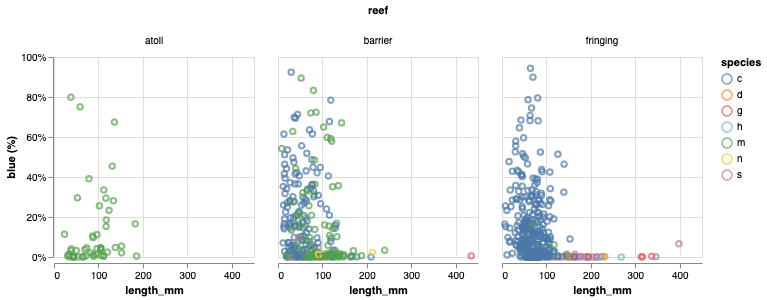

In [171]:
brush = alt.selection_interval()

alt.Chart(df).mark_point().encode(
    alt.X('length_mm'),
    alt.Y('b_noa', axis=alt.Axis(format='%',title='blue (%)'),scale=alt.Scale(domain=[0, 1])),
    color=alt.condition(brush, 'species', alt.value('lightgray')),
).properties(
    selection=brush,
    width = 200,
    height = 200
).facet(column='reef')

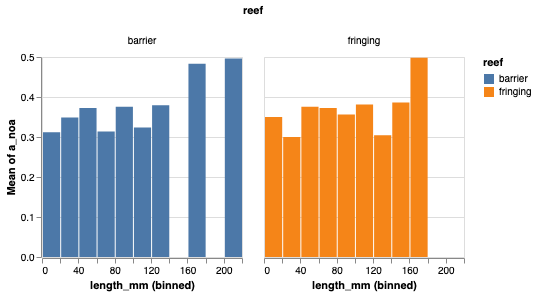

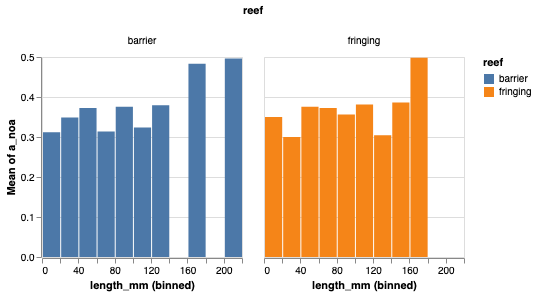

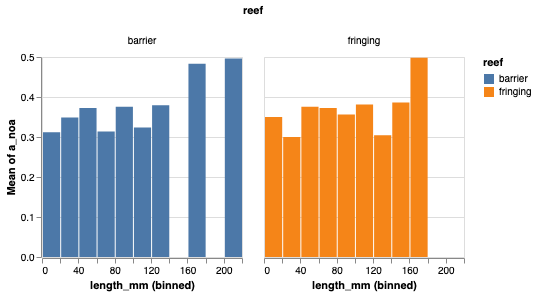

In [66]:
alt.Chart(df).mark_bar().encode(
    alt.X('length_mm', bin=alt.Bin(maxbins=15)),
    y='mean(a_noa)',
    color='reef',
).properties( width = 200,
    height = 200).facet(column='reef')

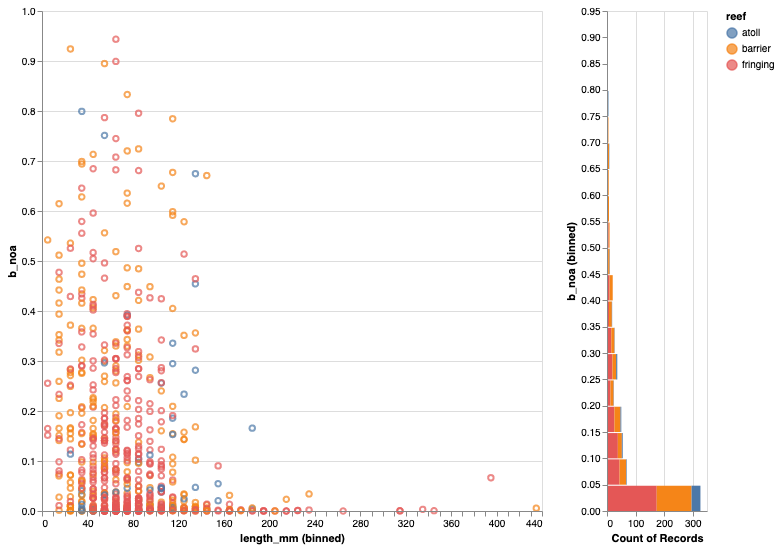

In [177]:
from selenium import webdriver

chart1 = alt.Chart(df).mark_point().encode(
    x=alt.X('length_mm', bin=alt.Bin(maxbins=50)),
    y='b_noa',
    color='reef'
).properties(
    height=500,
    width=500
)

chart2 = alt.Chart(df).mark_bar().encode(
    x='count()',
    y=alt.Y('b_noa', bin=alt.Bin(maxbins=20)),
    color='reef'
).properties(
    height=500,
    width=100
)

lengthalgae_scatterbar = chart1 | chart2
lengthalgae_scatterbar

#lengthalgae_scatterbar.save('lengthalgae_scatterbar.svg', scale_factor = 2.0)

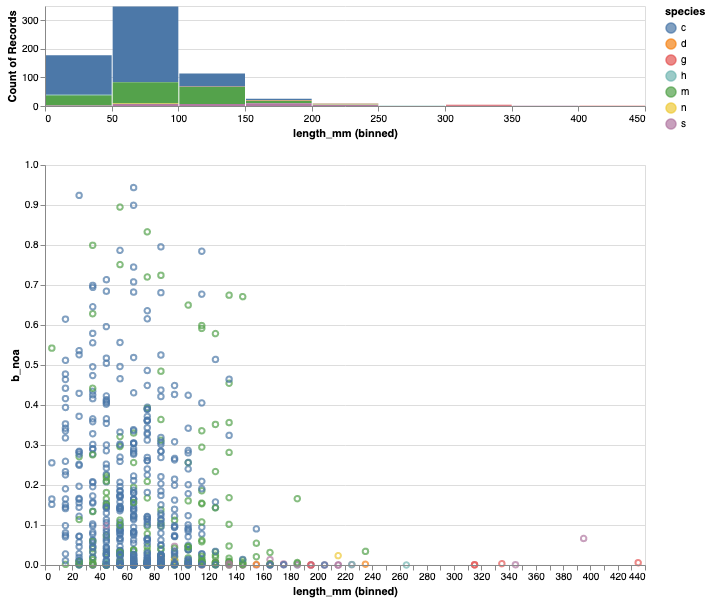

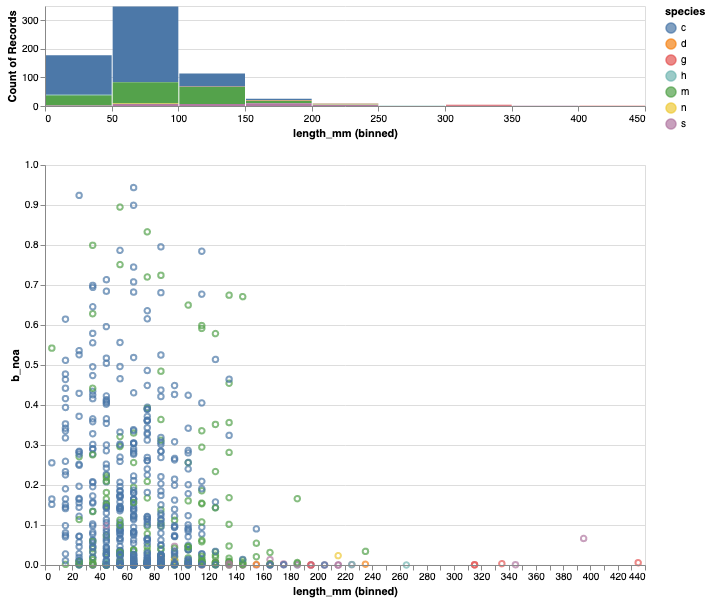

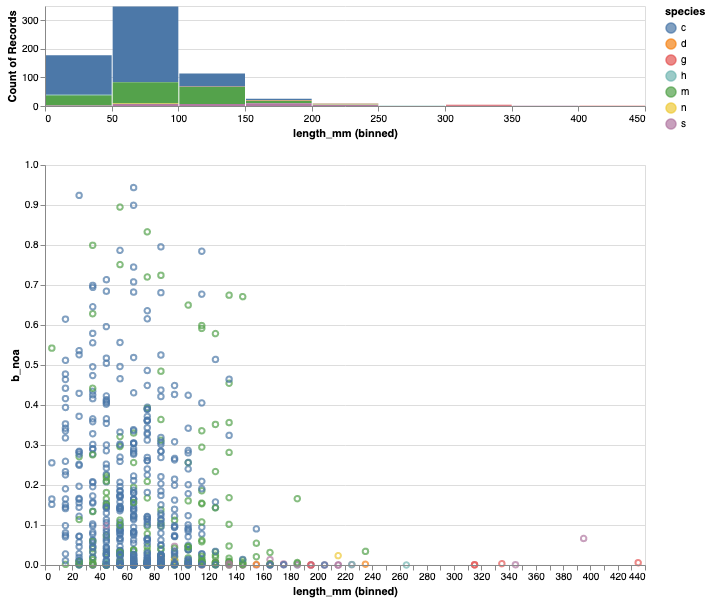

In [184]:

chart1 = alt.Chart(df).mark_point().encode(
    x=alt.X('length_mm', bin=alt.Bin(maxbins=50)),
    y='b_noa',
    color='species'
).properties(
    height=400,
    width=600
)

chart2 = alt.Chart(df).mark_bar().encode(
    x=alt.X('length_mm', bin=alt.Bin(maxbins=20)),
    y='count()',
    color='species'
).properties(
    height=100,
    width=600
)

alt.vconcat(chart2, chart1, data=df)



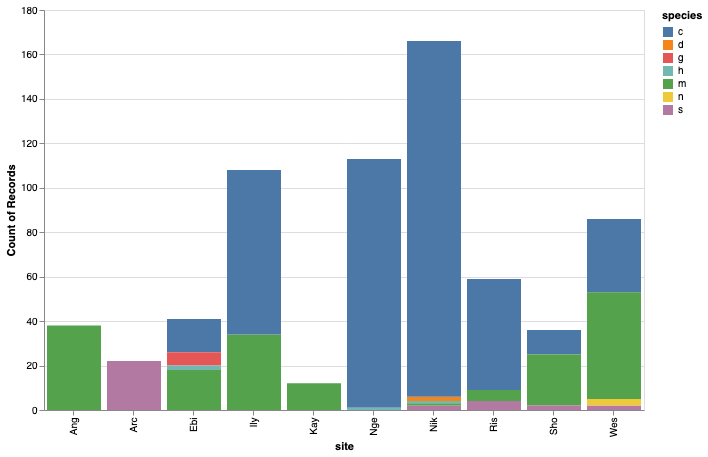

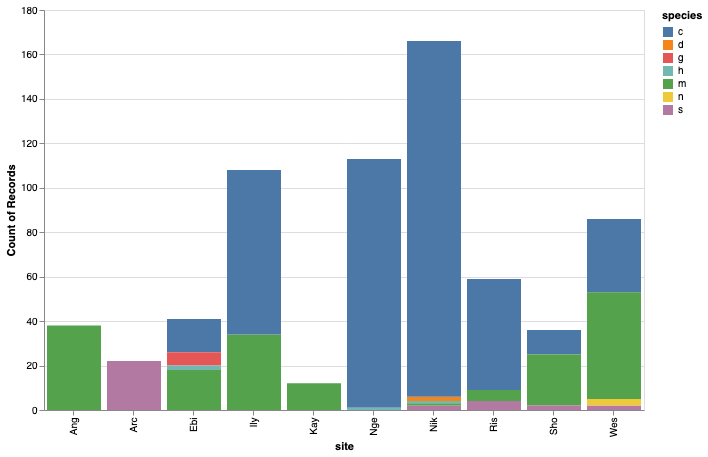

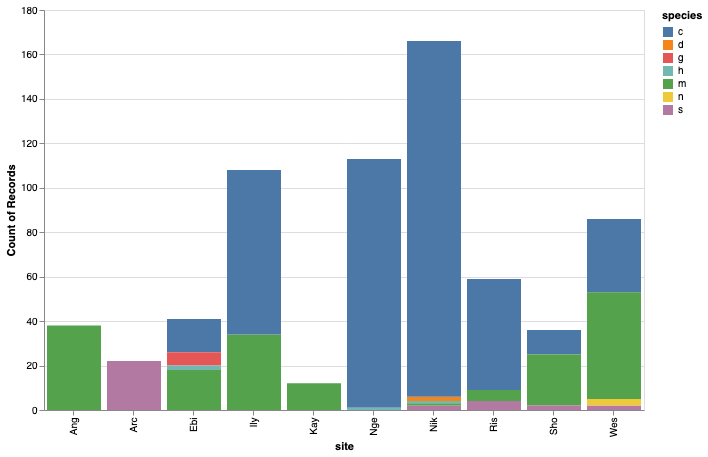

In [60]:
alt.Chart(df).mark_bar().encode(
    x='site',
    y='count()',
    color='species',
).properties(
    width = 600,
    height = 400
)


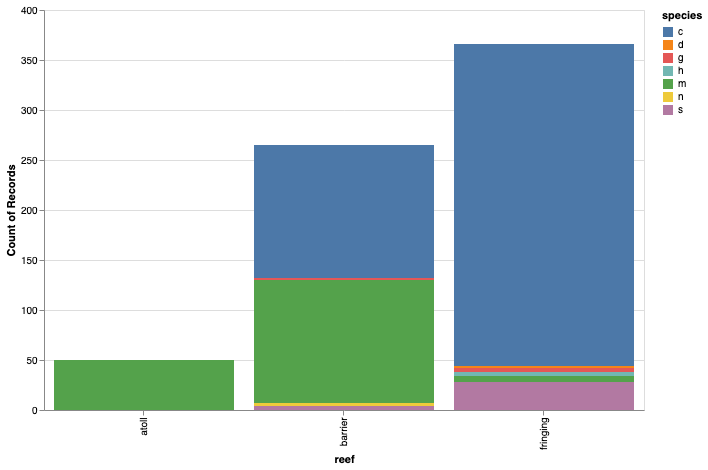

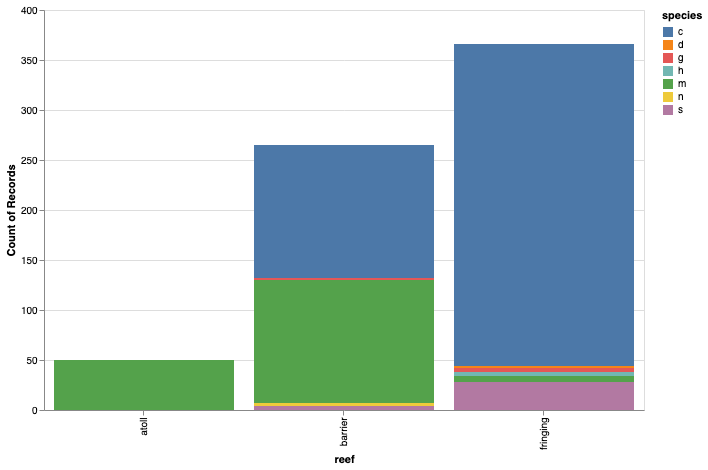

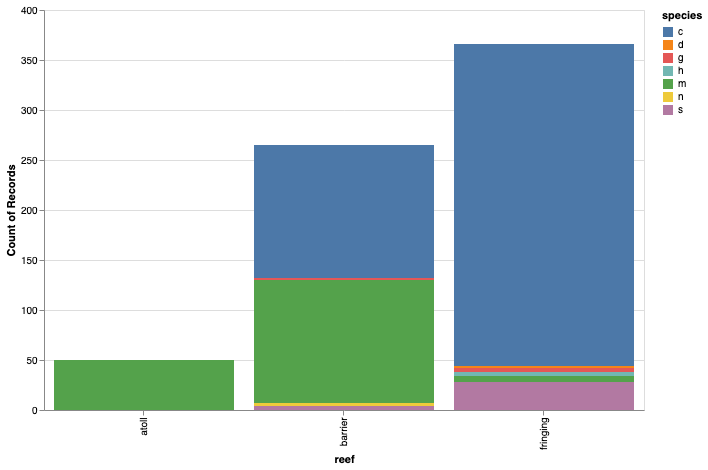

In [61]:
alt.Chart(df).mark_bar().encode(
    x='reef',
    y='count()',
    color='species',
).properties(
    width = 600,
    height = 400
)
